In [1]:
# interactive figure
%matplotlib widget

# auto reload modules
%load_ext autoreload
%autoreload 2

In [ ]:
import os
import dask
import warnings
import xarray as xr
import numpy as np
# import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
# import matplotlib.colors as mcolors
from sys import platform
from streamjoy import stream, wrap_matplotlib
from viztool import FormatScalarFormatter, pcolor_center, pcolor_limits
from dask.distributed import LocalCluster, Client
from dask_jobqueue import PBSCluster
# from dask.diagnostics import ProgressBar
from matplotlib.colors import LinearSegmentedColormap
# from matplotlib.ticker import FormatStrFormatter
# from mpl_toolkits.axes_grid1 import make_axes_locatable

import streamjoy
streamjoy.config['codec'] = 'h264'

In [3]:
if platform == 'linux' or platform == 'linux2':
    data_dir = '/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'
elif platform == 'darwin':
    data_dir = '/Users/zhihua/Documents/Work/Research/Projects/TRACE-SEAS/TracerInversion//Data/'
else:
    print('OS not supported.')

bname = 'd11_M003_Ri020_em01'
# cname = bname+'_Q010_W000_D000_St0'
cname = bname+'_Q001_W000_D000_St0'

In [ ]:
xyplane = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_top.nc')\
        .isel(xC=slice(999,None)).chunk(time=1)
xyplane.close()

xzplane = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_south.nc')\
          .isel(xC=slice(999,None)).sel(zC=slice(-102,-11)).chunk(time=1)
xzplane.close()

yzplane = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_xmid.nc')\
         .sel(zC=slice(-102,-11)).chunk(time=1)
yzplane.close()

xyplane['day'] = xyplane.time/np.timedelta64(1, 'D')
# xyplane['timeTf'] = dsf.time/np.timedelta64(int(np.around(2*np.pi/1e-4)), 's')
xyplane['xC'] = xyplane.xC/1e3
xyplane['xF'] = xyplane.xF/1e3
xyplane['yC'] = xyplane.yC/1e3
xyplane['yF'] = xyplane.yF/1e3
xzplane['xC'] = xzplane.xC/1e3
xzplane['xF'] = xzplane.xF/1e3
xzplane['yC'] = xzplane.yC/1e3
xzplane['yF'] = xzplane.yF/1e3
yzplane['xC'] = yzplane.xC/1e3
yzplane['xF'] = yzplane.xF/1e3
yzplane['yC'] = yzplane.yC/1e3
yzplane['yF'] = yzplane.yF/1e3

In [4]:
USER = os.getenv('USER')
TMPDIR = f'/glade/derecho/scratch/{USER}/temp'
job_script_prologue = [f'export TMPDIR={TMPDIR}', 'mkdir -p $TMPDIR']
cluster_kw = dict(job_name='prep_anim3d',
                  cores=1,
                  memory='1GiB',
                  processes=1,
                  local_directory=f'{TMPDIR}/pbs.$PBS_JOBID/dask/spill',
                  log_directory=f'{TMPDIR}/pbs.$PBS_JOBID/dask/worker_logs',
                  job_extra_directives=['-j oe', '-A UMCP0020'],
                  job_script_prologue=job_script_prologue,
                  resource_spec='select=1:ncpus=1:mem=1GB',
                  queue='casper',
                  walltime='60:00',
                  interface='ext')
cluster = PBSCluster(**cluster_kw)
client = Client(cluster)
print(cluster.job_script())
cluster.scale(64)
# print(cluster.dashboard_link.replace(':8787', ':1212/proxy/42843'))

#!/usr/bin/env bash

#PBS -N prep_anim3d
#PBS -q casper
#PBS -A UMCP0020
#PBS -l select=1:ncpus=1:mem=4GB
#PBS -l walltime=60:00
#PBS -e /glade/derecho/scratch/zhihuaz/temp/pbs.$PBS_JOBID/dask/worker_logs/
#PBS -o /glade/derecho/scratch/zhihuaz/temp/pbs.$PBS_JOBID/dask/worker_logs/
#PBS -j oe
#PBS -A UMCP0020
export TMPDIR=/glade/derecho/scratch/zhihuaz/temp
mkdir -p $TMPDIR
/glade/work/zhihuaz/conda-envs/trace-seas/bin/python -m distributed.cli.dask_worker tcp://128.117.208.173:40853 --name dummy-name --nthreads 1 --memory-limit 4.00GiB --nanny --death-timeout 60 --local-directory /glade/derecho/scratch/zhihuaz/temp/pbs.$PBS_JOBID/dask/spill --interface ext



/glade/work/zhihuaz/conda-envs/trace-seas/lib/python3.12/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41539 instead
  warnings.warn(


In [ ]:
var = 'c7'
xyplane[var] = np.log10(xyplane[var].clip(1e-3,1))
xzplane[var] = np.log10(xzplane[var].clip(1e-3,1))
yzplane[var] = np.log10(yzplane[var].clip(1e-3,1))

delayed_xync = xyplane.to_netcdf('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_anim3d_xy.nc',
                                 compute=False, mode='w')
delayed_xznc = xzplane.to_netcdf('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_anim3d_xz.nc',
                                 compute=False, mode='w')
delayed_yznc = yzplane.to_netcdf('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_anim3d_yz.nc',
                                 compute=False, mode='w')
delayed_xync.compute()
delayed_xznc.compute()
delayed_yznc.compute()

In [5]:
dsf = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_state.nc')\
        .isel(xC=slice(999,None)).sel(zC=slice(-102,-11)).chunk(time=1)
dsf.close()
dsf['xC'] = dsf.xC/1e3
dsf['xF'] = dsf.xF/1e3
dsf['yC'] = dsf.yC/1e3
dsf['yF'] = dsf.yF/1e3

xyplane = dsf.isel(zC=slice(-1,None))
xzplane = dsf.isel(yC=slice(0,1))
yzplane = dsf.isel(xC=slice(0,1))
xyplane['day'] = xyplane.time/np.timedelta64(1, 'D')

In [6]:
var = 'c7'
xyplane[var] = np.log10(xyplane[var].clip(1e-3,1))
xzplane[var] = np.log10(xzplane[var].clip(1e-3,1))
yzplane[var] = np.log10(yzplane[var].clip(1e-3,1))

delayed_xync = xyplane.to_netcdf('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_anim3d_xy.nc',
                                 compute=False, mode='w')
delayed_xznc = xzplane.to_netcdf('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_anim3d_xz.nc',
                                 compute=False, mode='w')
delayed_yznc = yzplane.to_netcdf('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_anim3d_yz.nc',
                                 compute=False, mode='w')
delayed_xync.compute()
delayed_xznc.compute()
delayed_yznc.compute()
cluster.close()
client.close()

In [4]:
from mpl_toolkits.mplot3d.axis3d import Axis
if not hasattr(Axis, '_get_coord_info_old'):
    def _get_coord_info_new(self, renderer):
        mins, maxs, centers, deltas, tc, highs = self._get_coord_info_old(renderer)
        mins += deltas / 4
        maxs -= deltas / 4
        return mins, maxs, centers, deltas, tc, highs
    Axis._get_coord_info_old = Axis._get_coord_info
    Axis._get_coord_info = _get_coord_info_new

def plot_box_frame(ax, xlim, ylim, zlim, azim, cloud=False, **edges_kw):
    xmin, xmax = xlim
    ymin, ymax = ylim
    zmin, zmax = zlim
    xazm = xmin if azim < -90 else xmax
    ax.plot([xmax, xmax], [ymin, ymax], zmax, **edges_kw)
    ax.plot([xmin, xmax], [ymin, ymin], zmax, **edges_kw)
    ax.plot([xmin, xmin], [ymin, ymax], zmax, **edges_kw)
    ax.plot([xmin, xmax], [ymax, ymax], zmax, **edges_kw)
    ax.plot([xmax, xmax], [ymin, ymin], [zmin, zmax], **edges_kw)
    ax.plot([xmin, xmin], [ymin, ymin], [zmin, zmax], **edges_kw)
    ax.plot([xazm, xazm], [ymax, ymax], [zmin, zmax], **edges_kw)
    if not cloud:
        ax.plot([xazm, xazm], [ymin, ymax], zmin, **edges_kw)
        ax.plot([xmin, xmax], [ymin, ymin], zmin, **edges_kw)
    else:
        ax.plot([xmin, xmin], [ymax, ymax], [zmin, zmax], **edges_kw)

# @wrap_matplotlib()
def plot_xyz3d(ax, ds, **kwargs):
    aspect_yz = kwargs.pop('aspect_yz')
    xlim      = kwargs.pop('xlim')
    ylim      = kwargs.pop('ylim')
    zlim      = kwargs.pop('zlim')
    azim      = kwargs.pop('azim')
    elev      = kwargs.pop('elev')
    sub_str   = kwargs.pop('sub_str')
    blines    = kwargs.pop('blines')
    cbtiks    = kwargs.pop('cbtiks')
    var       = kwargs.pop('var', 'b')

    # xyplane = ds[varsel].sel({zvar: -depth_lim[0], zb: -depth_lim[0]}, method='nearest')
    # xzplane = ds[varsel].isel({yvar: 0, yb: 0}).sel({zvar: slice(-depth_lim[1],xyplane[zvar]), zb: slice(-depth_lim[1],xyplane[zb])})
    # yzplane = ds[varsel].isel({xvar: -1, xb: -1}).sel({zvar: slice(-depth_lim[1],xyplane[zvar]), zb: slice(-depth_lim[1],xyplane[zb])})
    xyplane, xzplane, yzplane = ds
    xvar, yvar, zvar = sorted(xyplane[var].dims)
    xb, yb, zb = sorted(xyplane.b.dims)
    # if var in ['u', 'v', 'w']:
    #     xyplane[var] = xyplane[var]/ustar
    #     xzplane[var] = xzplane[var]/ustar
    #     yzplane[var] = yzplane[var]/ustar
    # elif var == 'c7':
        # xyplane[var] = np.log10(xyplane[var].clip(1e-3,1)).compute()
        # xzplane[var] = np.log10(xzplane[var].clip(1e-3,1)).compute()
        # yzplane[var] = np.log10(yzplane[var].clip(1e-3,1)).compute()
        # xyplane[var] = xyplane[var].clip(0,1)
        # xzplane[var] = xzplane[var].clip(0,1)
        # yzplane[var] = yzplane[var].clip(0,1)

    xyplane = xyplane.isel(zC=0)
    xzplane = xzplane.isel(yC=0)
    yzplane = yzplane.isel(xC=0)

    bkw_light = dict(levels=blines, linewidths=0.05, colors='xkcd:almost black')
    # bkw_dense = dict(levels=blines[:6], linewidths=0.2,  colors='xkcd:almost black')
    edges_kw  = dict(color='xkcd:charcoal', linewidth=1, zorder=2)

    ax.contourf(xyplane[xvar], xyplane[yvar], xyplane[var], zdir='z', offset=xyplane[zvar], **kwargs)
    ax.contour(xyplane[xb], xyplane[yb], xyplane.b, zdir='z', offset=xyplane[zb], **bkw_light)
    
    X, Z = np.meshgrid(xzplane[xvar], xzplane[zvar])
    im = ax.contourf(X, xzplane[var], Z, zdir='y', offset=xzplane[yvar], **kwargs)
    X, Z = np.meshgrid(xzplane[xb], xzplane[zb])
    ax.contour(X, xzplane.b, Z, zdir='y', offset=xzplane[yb], **bkw_light)
    # ax.contour(X, xzplane.b, Z, zdir='y', offset=xzplane[yb], **bkw_dense)
    # ax.plot(ds.xC, np.ones_like(ds.xC)*xzplane[yb].data, -ds.heps.isel(yC=0), lw=0.5, c='c')
    # ax.plot(ds.xC, np.ones_like(ds.xC)*xzplane[yb].data, -ds.heps.mean('yC'), lw=0.5, c='c')

    Y, Z = np.meshgrid(yzplane[yvar], yzplane[zvar])
    ax.contourf(yzplane[var], Y, Z, zdir='x', offset=yzplane[xvar], **kwargs)
    Y, Z = np.meshgrid(yzplane[yb], yzplane[zb])
    ax.contour(yzplane.b, Y, Z, zdir='x', offset=yzplane[xb], **bkw_light)
    # ax.contour(yzplane.b, Y, Z, zdir='x', offset=yzplane[xb], **bkw_dense)
    # ax.plot(np.ones_like(ds.yC)*yzplane[xb].data, ds.yC, -ds.heps.isel(xC=-1), lw=0.5, c='c')
    # ax.plot(np.ones_like(ds.yC)*yzplane[xb].data, ds.yC, -ds.heps.mean('xC'), lw=0.5, c='c')

    ax.axis('off')
    ax.set(xlim=xlim, ylim=ylim, zlim=zlim)
    ax.view_init(elev=elev, azim=azim)
    plot_box_frame(ax, xlim, ylim, zlim, azim=azim, **edges_kw)
    # ax.text2D(0.06, 0.06, sub_str, fontsize=8, ha='left', va='bottom', transform=ax.transAxes)
    ax.set_box_aspect((1, aspect_yz[0], aspect_yz[1]))

    cbar = plt.colorbar(im, ax=ax, location='bottom', shrink=0.6, aspect=40, pad=-0.06)
    # if cbtiks is not None:
    cbar.set_ticks(cbtiks)
    # cbar.ax.locator_params(nbins=5)
    cbar.formatter.set_powerlimits((0, 0))
    cbar.ax.tick_params(labelsize=5, length=2)
    cbar.ax.xaxis.get_offset_text().set_fontsize(5)
    cbar.set_label(label=sub_str, size=5)
    return im

In [ ]:
plt.close()
plt.figure()

# colorlist = ['xkcd:navy', 'xkcd:cerulean', 'xkcd:sky', 'xkcd:white', 'xkcd:coral', 'xkcd:deep red']
# nodes = [0.0, 0.5, 0.8, 0.9, 0.95, 1.0]
# cmap = LinearSegmentedColormap.from_list('buoyancy', list(zip(nodes, colorlist)))

# plt.contourf(xzplane.xC, xzplane.zC, xzplane.b.isel(time=100,yC=0), levels=np.arange(0.87, 1.82, 0.005)*1e-4, cmap=cmap, extend='both')
# plt.contour(xzplane.xC, xzplane.zC, xzplane.b.isel(time=100,yC=0), colors='k', linewidths=1, levels=np.arange(0.81, 1.82, 0.08)*1e-4);

# plt.contourf(xyplane.xC, xyplane.yC, xyplane.b.isel(time=300,zC=0), levels=np.arange(0.87, 1.82, 0.005)*1e-4, cmap=cmap, extend='both')
# plt.contour(xyplane.xC, xyplane.yC, xyplane.b.isel(time=300,zC=0), colors='k', linewidths=0.2, levels=np.arange(0.81, 1.82, 0.08)*1e-4);
# plt.gca().set_aspect('equal');

# plt.contourf(xzplane.xC, xzplane.zC, np.log10(xzplane.c7.isel(time=300,yC=0).clip(1e-4,1)), levels=np.linspace(-4, 0, 64), cmap='Greens', extend='both')
# plt.contour(xzplane.xC, xzplane.zC, xzplane.b.isel(time=300,yC=0), colors='k', linewidths=1, levels=np.arange(0.81, 1.82, 0.08)*1e-4);

# plt.contourf(xyplane.xC, xyplane.yC, np.log10(xyplane.c7.isel(time=350,zC=0).clip(1e-4,1)), levels=np.linspace(-4, 0, 64), cmap='Greens', extend='both')
# plt.contour(xyplane.xC, xyplane.yC, xyplane.b.isel(time=350,zC=0), colors='k', linewidths=0.2, levels=np.arange(0.81, 1.82, 0.08)*1e-4);
# plt.gca().set_aspect('equal');


### Reload processed data

In [4]:
xyplane = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_anim3d_xy.nc').chunk(time=1)
xyplane.close()
xzplane = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_anim3d_xz.nc').chunk(time=1)
xzplane.close()
yzplane = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+bname+'_spinup_anim3d_yz.nc').chunk(time=1)
yzplane.close()

xyplane1 = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_anim3d_xy.nc').chunk(time=1)
xyplane1.close()
xzplane1 = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_anim3d_xz.nc').chunk(time=1)
xzplane1.close()
yzplane1 = xr.open_dataset('/glade/derecho/scratch/zhihuaz/TracerInversion/Output/'+cname+'_anim3d_yz.nc').chunk(time=1)
yzplane1.close()

In [6]:
xlim = np.around(xzplane.xC.min().data), np.around(xzplane.xC.max().data)
ylim = np.around(yzplane.yC.min().data), np.around(yzplane.yC.max().data)
zlim = np.around(yzplane.zC.min().data), np.around(yzplane.zC.max().data)
Lx = xlim[1] - xlim[0]
Ly = ylim[1] - ylim[0]
Lz = zlim[1] - zlim[0]
ry = 2 if Lx/Ly >= 2 else 1
rz = 10
aspect_yz = Lx/Ly*ry, Lx/Lz*rz

colorlist = ['xkcd:twilight', 'xkcd:azure', 'xkcd:periwinkle blue', 'xkcd:bile', 'xkcd:marigold', 'xkcd:coral', 'xkcd:deep red']
nodes = [0.0, 0.34, 0.68, 0.76, 0.84, 0.92, 1.0]
cmapb = LinearSegmentedColormap.from_list('buoyancy', list(zip(nodes, colorlist)))

colorlist = ['xkcd:pale grey', 'xkcd:cloudy blue', 'xkcd:light peach', 'xkcd:algae green']
nodes = [0.0, 0.33, 0.66, 1.0]
# nodes = [0.0, 0.01, 0.1, 1.0]
cmapn = LinearSegmentedColormap.from_list('nutrient', list(zip(nodes, colorlist)))

varsel = 'c7'
# letter = 'abcdef'
group_kwargs = dict(var=['b', varsel],
                    cmap=[cmapb, cmapn],
                    blines=[np.arange(0.81, 1.82, 0.08)*1e-4],
                    sub_str=[r'Buoyancy [m s$^{-2}$]', r'Nutrient $log_{10}(c_7)$'],
                    levels=[np.arange(0.87, 1.76, 0.01)*1e-4, np.linspace(-3, 0, 64)],
                    cbtiks=[np.arange(1, 1.8, 0.2)*1e-4, np.linspace(-3, 0, 4)],
                    extend=['both', 'min'],
                    # sub_str=[r'Buoyancy [m s$^{-2}$]', r'Nutrient c$_7$'],
                    # levels=[np.arange(0.87, 1.76, 0.01)*1e-4, np.linspace(0, 1, 64)],
                    # cbtiks=[np.arange(1, 2, 0.2)*1e-4, np.linspace(0, 1, 6)],
                    # extend=['both', 'neither'],
                    aspect_yz=[aspect_yz],
                    xlim=[xlim], ylim=[ylim], zlim=[zlim],
                    azim=[-120],
                    elev=[35])

In [8]:
xzplane1.w.min().load()

<xarray.DataArray 'w' ()> Size: 4B
array(-0.00882242, dtype=float32)

In [15]:
xlim = np.around(xzplane.xC.min().data), np.around(xzplane.xC.max().data)
ylim = np.around(yzplane.yC.min().data), np.around(yzplane.yC.max().data)
zlim = np.around(yzplane.zC.min().data), np.around(yzplane.zC.max().data)
Lx = xlim[1] - xlim[0]
Ly = ylim[1] - ylim[0]
Lz = zlim[1] - zlim[0]
ry = 2 if Lx/Ly >= 2 else 1
rz = 10
aspect_yz = Lx/Ly*ry, Lx/Lz*rz

# colorlist = ['xkcd:pale grey', 'xkcd:cloudy blue', 'xkcd:light peach', 'xkcd:algae green']
colorlist = ['xkcd:carnation', 'xkcd:cloudy blue', 'xkcd:light peach', 'xkcd:algae green']
nodes = [0.0, 0.33, 0.66, 1.0]
# nodes = [0.0, 0.01, 0.1, 1.0]
cmapn = LinearSegmentedColormap.from_list('nutrient', list(zip(nodes, colorlist)))

varsel = 'c7'
# letter = 'abcdef'
group_kwargs = dict(var=['w', varsel],
                    cmap=['binary', cmapn],
                    blines=[np.arange(0.81, 1.82, 0.08)*1e-4],
                    sub_str=[r'w [m s$^{-1}$]', r'Nutrient $log_{10}(c_7)$'],
                    levels=[np.arange(-8.5, 9, 0.5)*1e-3, np.linspace(-3, 0, 64)],
                    cbtiks=[np.arange(-8, 10, 4)*1e-3, np.linspace(-3, 0, 4)],
                    extend=['both', 'min'],
                    # sub_str=[r'Buoyancy [m s$^{-2}$]', r'Nutrient c$_7$'],
                    # levels=[np.arange(0.87, 1.76, 0.01)*1e-4, np.linspace(0, 1, 64)],
                    # cbtiks=[np.arange(1, 2, 0.2)*1e-4, np.linspace(0, 1, 6)],
                    # extend=['both', 'neither'],
                    aspect_yz=[aspect_yz],
                    xlim=[xlim], ylim=[ylim], zlim=[zlim],
                    azim=[-120],
                    elev=[35])

In [17]:
def extract_ax_kwargs(group_kwargs, index):
    ax_kwargs = {}
    max_length = 0

    # First, determine the maximum length among all list/tuple values
    for value in group_kwargs.values():
        max_length = max(max_length, len(value))

    if index >= max_length:
        raise IndexError('Index out of range for one or more multi-value entries.')

    # Build the output dictionary for the given index
    for key, value in group_kwargs.items():
        if len(value) == 1:
            ax_kwargs[key] = value[0]
        else:
            ax_kwargs[key] = value[index]
    return ax_kwargs


# @wrap_matplotlib()
# def anim3d_group(ds, **group_kwargs):
#     plt.close()
#     nrow, ncol = 1, 2
#     subplot_kw = dict(projection='3d', computed_zorder=False)
#     fig, ax = plt.subplots(nrow, ncol, figsize=(6,3), dpi=600, subplot_kw=subplot_kw)
#     plt.subplots_adjust(wspace=0, hspace=0, top=1, bottom=0, right=1, left=0)

#     for i in range(ncol):
#         plt_kwargs = extract_ax_kwargs(group_kwargs, i)
#         plot_xyz3d(ax[i], ds, **plt_kwargs)
#     fig.suptitle(f'Day {ds[0].day.data:.2f}')
#     return fig

@wrap_matplotlib()
def anim3d_group(ds, init_convec_day=7, **group_kwargs):
    plt.close()
    
    fig = plt.figure(figsize=(8, 4.3), dpi=600, constrained_layout=True)
    gs  = fig.add_gridspec(6, 2, hspace=0, wspace=0, top=1, bottom=0, right=1, left=0)
    subplot_kw = dict(projection='3d', computed_zorder=False)
    
    for i in range(2):
        plt_kwargs = extract_ax_kwargs(group_kwargs, i)
        # if i == 0 and ds[0].day.data > init_convec_day:
        #     bmax = np.ceil(ds[0].b.max().load().data*1e6)/1e2
        #     plt_kwargs.update(levels=np.arange(0.87, bmax, 0.005)*1e-4) # in place
        #     plt_kwargs.update(cbtiks=np.arange(1, bmax+1e-4, 0.2)*1e-4)
        ax = fig.add_subplot(gs[:,i], **subplot_kw)
        plot_xyz3d(ax, ds, **plt_kwargs)
    
    ax0 = fig.add_subplot(gs[0,:])
    const_B0 = ds[0].attrs['B₀']
    nphr = 2 if ds[0].day.data < init_convec_day else 3
    dummy_days = np.arange(0, ds[0].day.data+1/(24*nphr)/2, 1/(24*nphr))
    B0_history = np.zeros_like(dummy_days)
    B0_history[dummy_days >= init_convec_day] = const_B0
    ax0.plot(dummy_days, B0_history, c='c', lw=1, zorder=3, clip_on=False)
    ax0.scatter(dummy_days[-1], B0_history[-1], 15, 'xkcd:cyan', edgecolor='k', linewidth=0.8, zorder=3, clip_on=False)
    ax0.set_xlim(0, 11)
    ax0.set_ylim(0, 5e-9)
    ax0.grid(ls='--', lw=0.2, c='gray')
    ax0.tick_params(labelsize=5, length=2)
    ax0.yaxis.get_offset_text().set_fontsize(5)
    ax0.set_ylabel(r'B$_0$ [m s$^{-2}$]', fontsize=5)
    ax0.set_xlabel('Days', fontsize=5)
    return fig

In [ ]:
i = 24*2*9
anim3d_group((xyplane.isel(time=i), xzplane.isel(time=i), yzplane.isel(time=i)), **group_kwargs)
plt.savefig('../Figures/M003_Ri020_em01_Q000_W000_D000_St0_b_c7_day9.png');

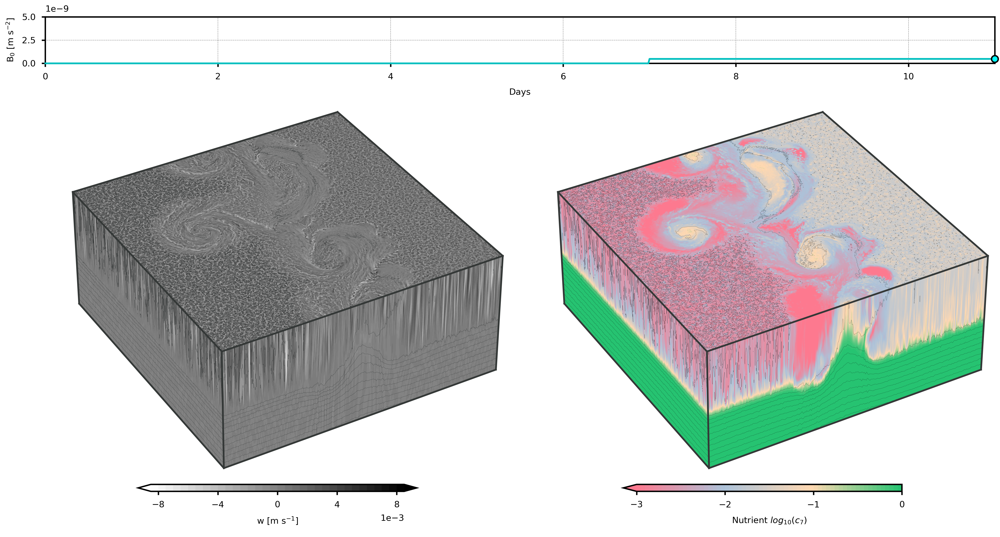

In [16]:
i = 24*3*4-1
anim3d_group((xyplane1.isel(time=i), xzplane1.isel(time=i), yzplane1.isel(time=i)), **group_kwargs)
plt.savefig('../Figures/M003_Ri020_em01_Q010_W000_D000_St0_w_c7.png');
# plt.savefig('../Figures/M003_Ri020_em01_Q010_W000_D000_St0_b_c7_day9.png');

In [18]:
USER = os.getenv('USER')
TMPDIR = f'/glade/derecho/scratch/{USER}/temp'
job_script_prologue = [f'export TMPDIR={TMPDIR}', 'mkdir -p $TMPDIR']
cluster_kw = dict(job_name='anim3d',
                  cores=1,
                  memory='20GiB',
                  processes=1,
                  local_directory=f'{TMPDIR}/pbs.$PBS_JOBID/dask/spill',
                  log_directory=f'{TMPDIR}/pbs.$PBS_JOBID/dask/worker_logs',
                  job_extra_directives=['-j oe', '-A UMCP0020'],
                  job_script_prologue=job_script_prologue,
                  resource_spec='select=1:ncpus=1:mem=20GB',
                  queue='casper',
                  walltime='60:00',
                  interface='ext')
cluster = PBSCluster(**cluster_kw)
client = Client(cluster)
print(cluster.job_script())
cluster.scale(16)
# print(cluster.dashboard_link.replace(':8787', ':1212/proxy/42843'))

#!/usr/bin/env bash

#PBS -N anim3d
#PBS -q casper
#PBS -A UMCP0020
#PBS -l select=1:ncpus=1:mem=20GB
#PBS -l walltime=60:00
#PBS -e /glade/derecho/scratch/zhihuaz/temp/pbs.$PBS_JOBID/dask/worker_logs/
#PBS -o /glade/derecho/scratch/zhihuaz/temp/pbs.$PBS_JOBID/dask/worker_logs/
#PBS -j oe
#PBS -A UMCP0020
export TMPDIR=/glade/derecho/scratch/zhihuaz/temp
mkdir -p $TMPDIR
/glade/work/zhihuaz/conda-envs/trace-seas/bin/python -m distributed.cli.dask_worker tcp://128.117.208.174:35173 --name dummy-name --nthreads 1 --memory-limit 20.00GiB --nanny --death-timeout 60 --local-directory /glade/derecho/scratch/zhihuaz/temp/pbs.$PBS_JOBID/dask/spill --interface ext



In [ ]:
%%time
stream_sipnup = stream([(xyplane.isel(time=i), xzplane.isel(time=i), yzplane.isel(time=i)) for i in range(6*24*2, 7*24*2)],
                       renderer=anim3d_group,
                       max_frames=-1,
                       renderer_kwargs=group_kwargs,
                       client=client, fps=7,
                       write_kwargs=dict(crf='18'),
                       threads_per_worker=1)
stream_convec = stream([(xyplane1.isel(time=i), xzplane1.isel(time=i), yzplane1.isel(time=i)) for i in range(xyplane1.time.size)],
                       renderer=anim3d_group,
                       max_frames=-1,
                       renderer_kwargs=group_kwargs,
                       client=client, fps=7,
                       write_kwargs=dict(crf='18'),
                       threads_per_worker=1)
joined_stream = sum([stream_sipnup, stream_convec])
joined_stream.write(f'../Animations/{cname[4:]}_b_c7.mp4')
cluster.close()
client.close()

In [19]:
%%time
stream_convec = stream([(xyplane1.isel(time=i), xzplane1.isel(time=i), yzplane1.isel(time=i)) for i in range(xyplane1.time.size)],
                       renderer=anim3d_group,
                       max_frames=-1,
                       renderer_kwargs=group_kwargs,
                       client=client, fps=7,
                       write_kwargs=dict(crf='18'),
                       threads_per_worker=1)
stream_convec.write(f'../Animations/{cname[4:]}_w_c7.mp4')
cluster.close()
client.close()

<Client: 'tcp://128.117.208.174:35173' processes=16 threads=16, memory=320.00 GiB>

[SUCCESS] 02:39PM: Saved stream to /glade/u/home/zhihuaz/Projects/TRACE-SEAS/TracerInversion/Analysis/../Animations/M003_Ri020_em01_Q001_W000_D000_St0_w_c7.mp4.


CPU times: user 2min 56s, sys: 9.25 s, total: 3min 5s
Wall time: 3min 39s
